<h1><center><b>LSTM Music Genre Classification</b></center></h1>``

1. Team
    1. Chon Kachand
    2. Jelena Culibao
    3. Haadi Zubairi
    4. Jaewhi Park

# **Music Classification: An Introduction**

In an era of extensive digital music libraries, efficient and accurate genre classification has become critical for personalized recommendations and improved music discovery. Traditional approaches to music genre classification mainly rely on audio features, extracting them from audio spectrograms and overlooking the contextual richness of lyrics. We have taken a slightly different approach, attempting to exploit the uniqueness of lyrical features to try and classify songs into genres.

We have utilised both an LSTM and Bi-Directional LSTM on both a 10-class and simplified 2-class classification task, testing model performance on 5 different lyrics transformations to find an optimal algorithm-transformation combination on both a simple and more complex classification task.

# Import Relevant Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence
from functools  import reduce
import re
from sklearn.metrics import confusion_matrix
from collections import Counter

In [2]:
import warnings
warnings.filterwarnings("ignore")

# **Import Lyrics Data and Basic Data Cleaning**

The dataset we used was taken from the [Multi-Lingual Lyrics for Genre Classification](https://www.kaggle.com/datasets/mateibejan/multilingual-lyrics-for-genre-classification) dataset on Kaggle. This dataset contains over 290,000 songs across 33 languages. Each song is described by 4 features - Artist, Genre, Language, Lyrics. We have decided to utilise only the Lyrics as a predictor for genre, as we hypothesise that there are sufficient distinguishing features within the lyrics alone to sufficiently distinguish between genres.

While this dataset contains lyrics from multiple languages, we restricted the lyrics to only English Lyrics for simplicity. Looking into the data, we also noticed a number of non-language characters in the data, for which we introduce the first transformation - *Cleaned Lyrics*. This transformation removes the non-language characters as below. 

We have also restricted the dataset to songs with at least 100 words to ensure that each song has sufficient context to make predictions. This has led to a second transformation - *Cleaned Limited Lyrics*. This transformation reduces each song to its first 100 words to ensure that each lyric input into the algorithms are of identical length.

In [3]:
def remove_non_language_chars(text):
    cleaned_text = re.sub(r'[^a-zA-Z\s]', '', text)
    cleaned_text = cleaned_text.replace('\n', ' ')
    cleaned_text = cleaned_text.replace('\t', ' ')
    cleaned_text = cleaned_text.replace('\x85', ' ')
    cleaned_text = cleaned_text.replace('\xa0', ' ')
    cleaned_text = cleaned_text.replace('\u2028', ' ')
    cleaned_text = cleaned_text.replace('\u3000', ' ')
    return cleaned_text

In [4]:
nwords = 100
train_data = pd.read_csv(r'C:\Users\Shado\Downloads\music_lyrics\train.csv').dropna()
train_data = train_data[train_data['Language'] == 'en'].reset_index()
train_data['Cleaned_Lyrics'] = train_data['Lyrics'].apply(remove_non_language_chars)
train_data['lengths'] = train_data['Cleaned_Lyrics'].str.split(' ').str.len()
train_data = train_data[train_data['lengths'] >= nwords]
train_data['Cleaned_Limited_Lyrics'] = train_data['Cleaned_Lyrics'].str.split(' ').apply(lambda x: x[:nwords]).apply(lambda x: ' '.join(x))

train_data.head()

,index,Artist,Song,Genre,Language,Lyrics,Cleaned_Lyrics,lengths,Cleaned_Limited_Lyrics
0,0,12 stones,world so cold,Rock,en,"It starts with pain, followed by hate\nFueled ...",It starts with pain followed by hate Fueled by...,332,It starts with pain followed by hate Fueled by...
1,1,12 stones,broken,Rock,en,Freedom!\nAlone again again alone\nPatiently w...,Freedom Alone again again alone Patiently wait...,248,Freedom Alone again again alone Patiently wait...
2,2,12 stones,3 leaf loser,Rock,en,"Biting the hand that feeds you, lying to the v...",Biting the hand that feeds you lying to the vo...,142,Biting the hand that feeds you lying to the vo...
3,3,12 stones,anthem for the underdog,Rock,en,You say you know just who I am\nBut you can't ...,You say you know just who I am But you cant im...,156,You say you know just who I am But you cant im...
4,4,12 stones,adrenaline,Rock,en,My heart is beating faster can't control these...,My heart is beating faster cant control these ...,337,My heart is beating faster cant control these ...


# **Exploratory Data Analysis**

Here we take a deeper look into the data to identify any points of interest. First, we look into the distribution of genres in the dataset. A heavily biased dataset with highly imbalanced classes will result in a very poor performing model, so we would like to see how the classes are distributed so that we can transform our dataset to prevent this outcome.

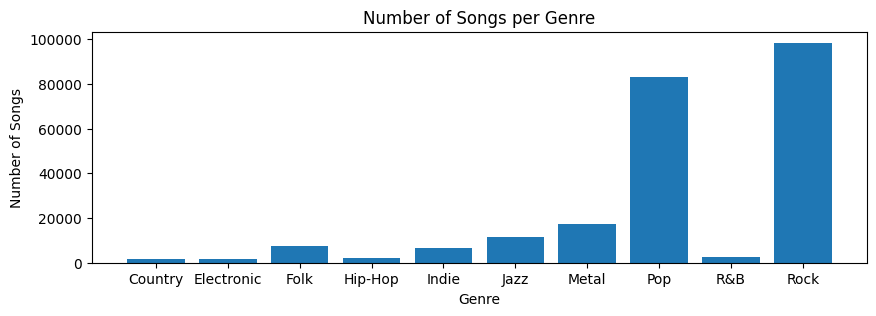

In [5]:
x = list(train_data.groupby('Genre').count().reset_index()['Genre'])
y = list(train_data.groupby('Genre').count().reset_index()['Language'])

plt.figure(figsize=(10,3))
plt.title("Number of Songs per Genre")
plt.xlabel("Genre")
plt.ylabel("Number of Songs")
plt.bar(x,y)
plt.show()

Looking at the above graph, we can clearly see that the dataset seems to be very heavily biased towards the Rock and Pop genres. As such, we will limit the dataset to only the first 2000 songs represented within each genre to reduce this bias. While this will significantly reduce the amount of training data available to the model, it will ensure that the training data is actually useful to the model. Moreover, this restriction will reduce training time to a much more reasonable level.

In [6]:
train_data = train_data.groupby(['Genre']).head(2000).reset_index()

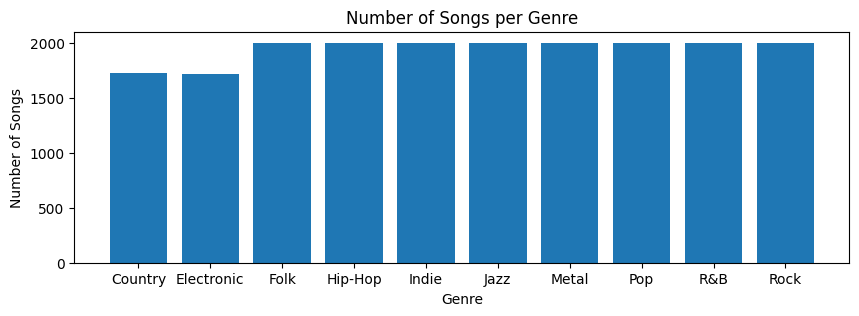

In [7]:
x = list(train_data.groupby('Genre').count().reset_index()['Genre'])
y = list(train_data.groupby('Genre').count().reset_index()['Language'])

plt.figure(figsize=(10,3))
plt.title("Number of Songs per Genre")
plt.xlabel("Genre")
plt.ylabel("Number of Songs")
plt.bar(x,y)
plt.show()

Looking at the above distribution, we can clearly see that, while it is not perfect and there exists some degree of imbalance, it is much better than before and also has likely enough training data for each class for the model to use as input.

Following on from genre class frequencies, we are interested in word frequencies across all songs across all genres. This will help us determine if our lyrics between genres seem to be correlated and if there is more work that needs to be done to preprocess the data before providing it as input into the algorithms. We will do this by first taking the 10 most common words in each song's *Cleaned Lyrics*, then consider the top 30 most frequent words in each genre, and then sum across those top 30 words to produce a frequency distribution of the most popular words in our dataset. We have chosen to restrict it in this way as, with the over 2000 songs per genre we are considering, there is quite a large number of unique words. Since we are looking at correlations, we are only interested in the most frequent words, and subsetting the data in this way appears to produce a meaningful distribution, as we can see below.

In [8]:
# Produce the lists of words in each song and the 
# frequencies of those words within their respective song
train_data['words'] = train_data['Cleaned_Lyrics'].apply(lambda x: x.split())
train_data['word_freq'] = train_data['words'].apply(lambda x: dict(Counter(x).most_common(10)))

In [9]:
# Here we combine the word frequency dictionaries for each genre using python's Counter. We then take 
# the top 30 most common words by genre and sort them in descending order, finally adding them to a 
# list containing the total frequencies of the top 30 words for each genre.
dictionaries = []
for genre in train_data['Genre'].unique():
    combined_dict = Counter()
    for words_dict in train_data[train_data['Genre'] == genre]['word_freq']:
        combined_dict += Counter(words_dict)

    sorted_combined_dict = dict(sorted(combined_dict.most_common(30), key=lambda item: item[1], reverse=True))
    print('genre is ', genre)
    print(len(sorted_combined_dict))
    print(sorted_combined_dict)
    dictionaries.append(sorted_combined_dict)

genre is  Rock
30
{'the': 14476, 'I': 13157, 'you': 11905, 'a': 7473, 'to': 7396, 'me': 5178, 'and': 3663, 'it': 3631, 'my': 3126, 'Im': 2964, 'your': 2894, 'in': 2874, 'of': 2572, 'And': 2385, 'on': 2004, 'be': 1511, 'You': 1493, 'that': 1386, 'we': 1293, 'all': 1210, 'got': 1031, 'is': 1006, 'for': 968, 'up': 870, 'dont': 859, 'love': 825, 'know': 781, 'down': 738, 'do': 733, 'The': 661}
genre is  Metal
30
{'the': 17508, 'I': 14919, 'you': 13162, 'to': 10000, 'me': 7355, 'your': 3878, 'my': 3699, 'a': 3691, 'of': 3621, 'and': 3160, 'in': 2942, 'Im': 2756, 'it': 2689, 'that': 1733, 'is': 1701, 'will': 1694, 'And': 1654, 'be': 1638, 'all': 1622, 'this': 1509, 'for': 1494, 'on': 1424, 'we': 1268, 'You': 1251, 'know': 981, 'The': 922, 'never': 802, 'dont': 773, 'not': 667, 'now': 652}
genre is  Pop
30
{'I': 14356, 'the': 14154, 'you': 12419, 'to': 7427, 'a': 6128, 'me': 4661, 'and': 4100, 'it': 3275, 'my': 3214, 'Im': 3025, 'of': 2415, 'on': 2394, 'in': 2300, 'your': 1996, 'And': 1789, '

In [10]:
# Now we produce a dataframe of the most common words across all genres
total_freq = Counter()
for d in dictionaries:
    total_freq += Counter(d)
freq_df = pd.DataFrame(dict(sorted(total_freq.most_common(30), key=lambda item: item[1], reverse=True)), index=[0]).T.reset_index().rename(columns={'index': 'word', 0: 'freq'}) 

In [11]:
# We can print out the most common words for a first glance.
most_common_words = list(freq_df['word'])
most_common_word_freq = list(freq_df['freq'])
print(most_common_words)

['the', 'I', 'you', 'to', 'a', 'me', 'and', 'my', 'it', 'in', 'Im', 'of', 'your', 'And', 'on', 'that', 'be', 'is', 'love', 'for', 'we', 'You', 'all', 'know', 'dont', 'up', 'like', 'with', 'i', 'do']


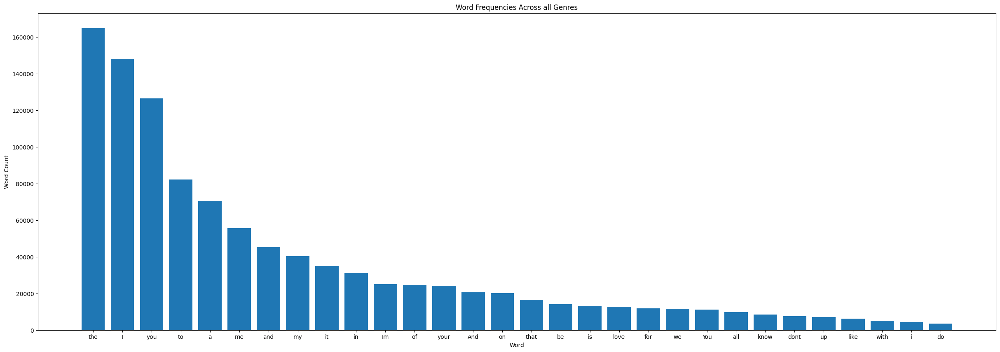

In [12]:
# Producing a frequency histogram of these words to better visualise these frequencies
plt.figure(figsize=(30,10))
plt.title("Word Frequencies Across all Genres")
plt.xlabel("Word")
plt.ylabel("Word Count")
plt.bar(most_common_words, most_common_word_freq)
plt.show()

As we can see, the most common words in the above graph appear to be stop words. In the context of NLP, stop words are words that contain no meaning. Common examples of stop words in English include 'a', 'the' and 'are'. While there is no universal list of stop words, we can obtain a list of stop words from the NLTK - Natural Language ToolKit package. Removing these words from our lyrics will hopefully remove some of the noise in the dataset and help us extract the most meaningful words.

With this, we get our 4th data transformation -  *Cleaned Lyrics T1*. This transformation takes our *Cleaned Lyrics* and removes stop words.

In [13]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('punkt')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Shado\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [14]:
train_data['Cleaned_Lyrics_T1'] = train_data['Cleaned_Lyrics'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word.lower() not in stop_words]))

Using this new transformation, we will now look at the frequency of words in each of our transformations up until this point. However, this time, we will also investigate these word frequencies by genre to determine how common words are spread across each of the genres for each of our data transformations.

In [15]:
# Here we define, and in some cases re-define, the 3 metrics we will need for each data transformation
# moving forward, being the words, their frequency and the song length
train_data['words'] = train_data['Lyrics'].apply(lambda x: x.split())
train_data['word_freq'] = train_data['words'].apply(lambda x: dict(Counter(x).most_common(10)))
train_data['Song_Length'] = train_data['Lyrics'].str.split(' ').str.len()

train_data['words_cleaned'] = train_data['Cleaned_Lyrics'].apply(lambda x: x.split())
train_data['word_freq_cleaned'] = train_data['words_cleaned'].apply(lambda x: dict(Counter(x).most_common(10)))
train_data['Song_Length_Cleaned'] = train_data['Cleaned_Lyrics'].str.split(' ').str.len()

train_data['words_cleaned_t1'] = train_data['Cleaned_Lyrics_T1'].apply(lambda x: x.split())
train_data['word_freq_cleaned_t1'] = train_data['words_cleaned_t1'].apply(lambda x: dict(Counter(x).most_common(50)))
train_data['Song_Length_Cleaned_T1'] = train_data['Cleaned_Lyrics_T1'].str.split(' ').str.len()

train_data['words_cleaned_limited'] = train_data['Cleaned_Limited_Lyrics'].apply(lambda x: x.split())
train_data['word_freq_cleaned_limited'] = train_data['words_cleaned_limited'].apply(lambda x: dict(Counter(x).most_common(50)))
train_data['Song_Length_Cleaned_Limited'] = train_data['Cleaned_Limited_Lyrics'].str.split(' ').str.len()

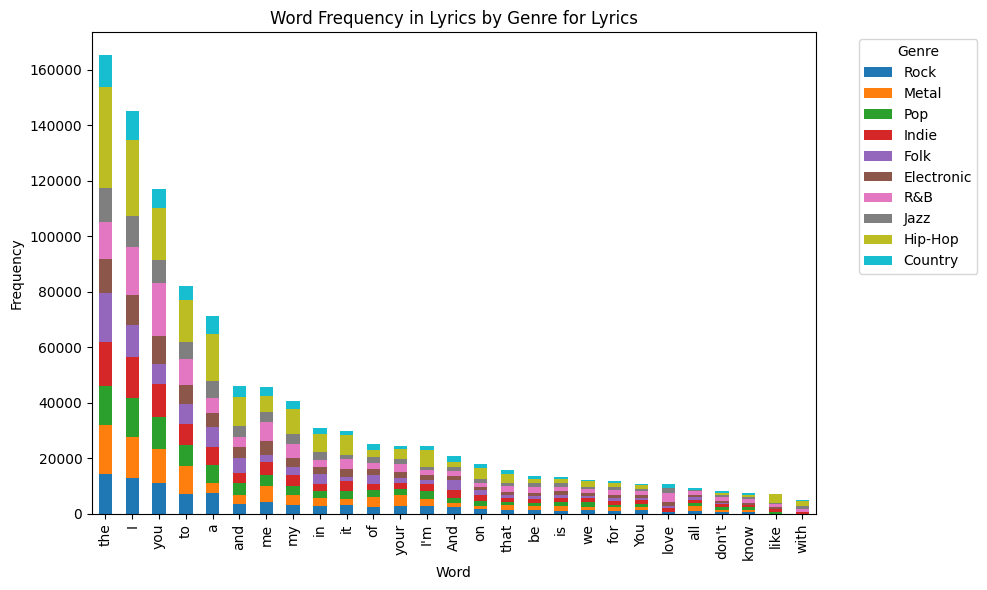

In [16]:
# Reproducing what we did above for each of our data transformations to produce
# a word-frequency dataframe by genre. We limit the total frequency to 5000 for a cleaner plot.
frequency_limit = 5000
dictionaries = []
for genre in train_data['Genre'].unique():
    combined_dict = Counter()
    for words_dict in train_data[train_data['Genre'] == genre]['word_freq']:
        combined_dict += Counter(words_dict)

    sorted_combined_dict = dict(sorted(combined_dict.most_common(30), key=lambda item: item[1], reverse=True))
    dictionaries.append(sorted_combined_dict)


dictionary_words = set(word for dictionary in dictionaries for word in dictionary.keys())
data = {word: [dictionary.get(word, 0) for dictionary in dictionaries] for word in dictionary_words}
df = pd.DataFrame(data).T.reset_index()
df.columns = ['Word'] + list(train_data['Genre'].unique())
df.set_index('Word', inplace=True)

df['Total'] = df.sum(axis=1)
df_sorted = df.sort_values(by='Total', ascending=False)
df_plot = df_sorted[df_sorted['Total'] >= frequency_limit].drop(columns=['Total'])

ax = df_plot.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.title('Word Frequency in Lyrics by Genre for Lyrics')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

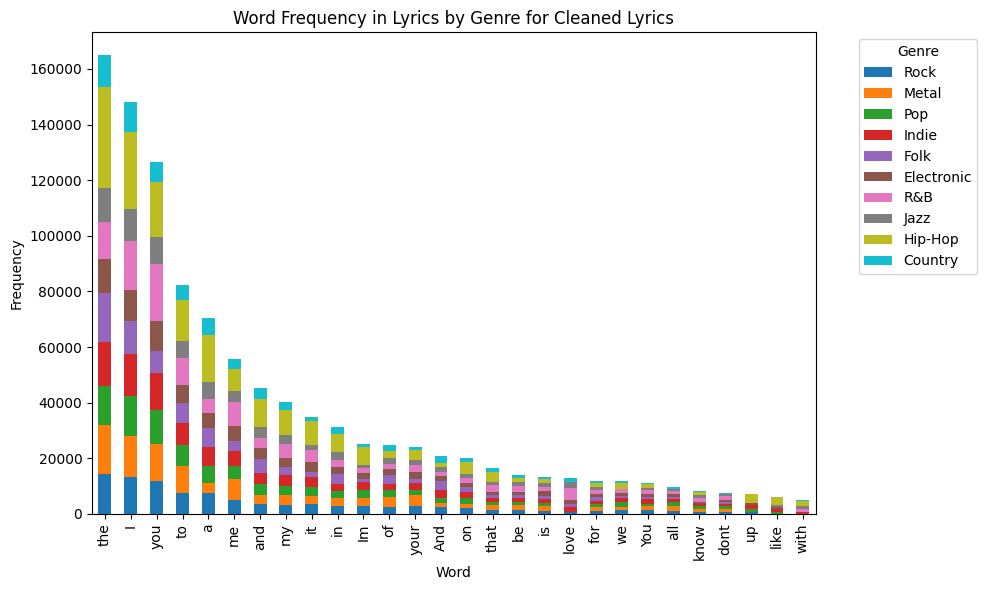

In [17]:
dictionaries = []
for genre in train_data['Genre'].unique():
    combined_dict = Counter()
    for words_dict in train_data[train_data['Genre'] == genre]['word_freq_cleaned']:
        combined_dict += Counter(words_dict)

    sorted_combined_dict = dict(sorted(combined_dict.most_common(30), key=lambda item: item[1], reverse=True))
    dictionaries.append(sorted_combined_dict)


dictionary_words = set(word for dictionary in dictionaries for word in dictionary.keys())
data = {word: [dictionary.get(word, 0) for dictionary in dictionaries] for word in dictionary_words}
df = pd.DataFrame(data).T.reset_index()
df.columns = ['Word'] + list(train_data['Genre'].unique())
df.set_index('Word', inplace=True)

df['Total'] = df.sum(axis=1)
df_sorted = df.sort_values(by='Total', ascending=False)
df_plot = df_sorted[df_sorted['Total'] >= frequency_limit].drop(columns=['Total'])

ax = df_plot.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.title('Word Frequency in Lyrics by Genre for Cleaned Lyrics')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

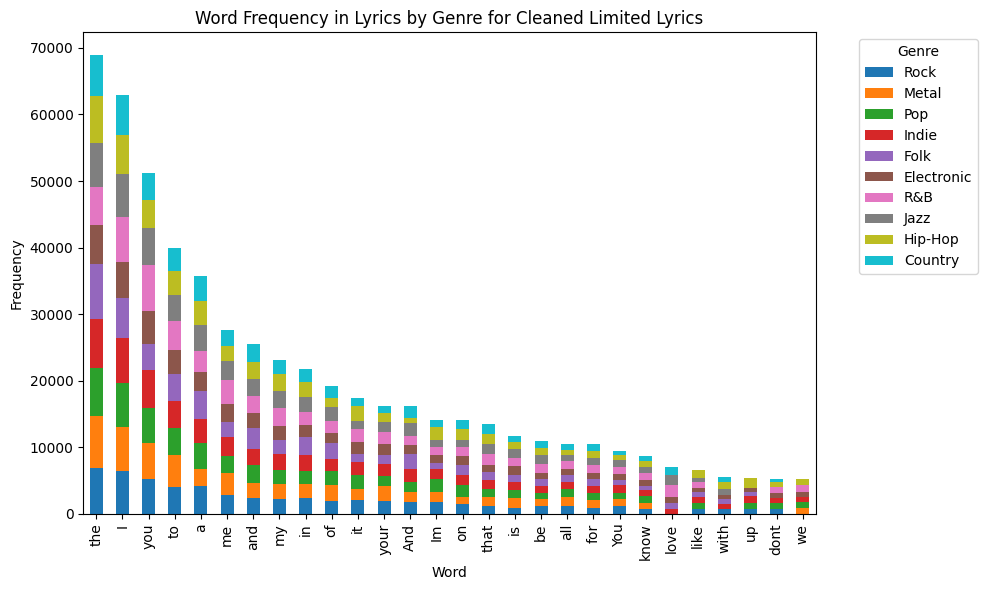

In [18]:
dictionaries = []
for genre in train_data['Genre'].unique():
    combined_dict = Counter()
    for words_dict in train_data[train_data['Genre'] == genre]['word_freq_cleaned_limited']:
        combined_dict += Counter(words_dict)

    sorted_combined_dict = dict(sorted(combined_dict.most_common(30), key=lambda item: item[1], reverse=True))
    dictionaries.append(sorted_combined_dict)


dictionary_words = set(word for dictionary in dictionaries for word in dictionary.keys())
data = {word: [dictionary.get(word, 0) for dictionary in dictionaries] for word in dictionary_words}
df = pd.DataFrame(data).T.reset_index()
df.columns = ['Word'] + list(train_data['Genre'].unique())
df.set_index('Word', inplace=True)

df['Total'] = df.sum(axis=1)
df_sorted = df.sort_values(by='Total', ascending=False)
df_plot = df_sorted[df_sorted['Total'] >= frequency_limit].drop(columns=['Total'])

ax = df_plot.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.title('Word Frequency in Lyrics by Genre for Cleaned Limited Lyrics')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

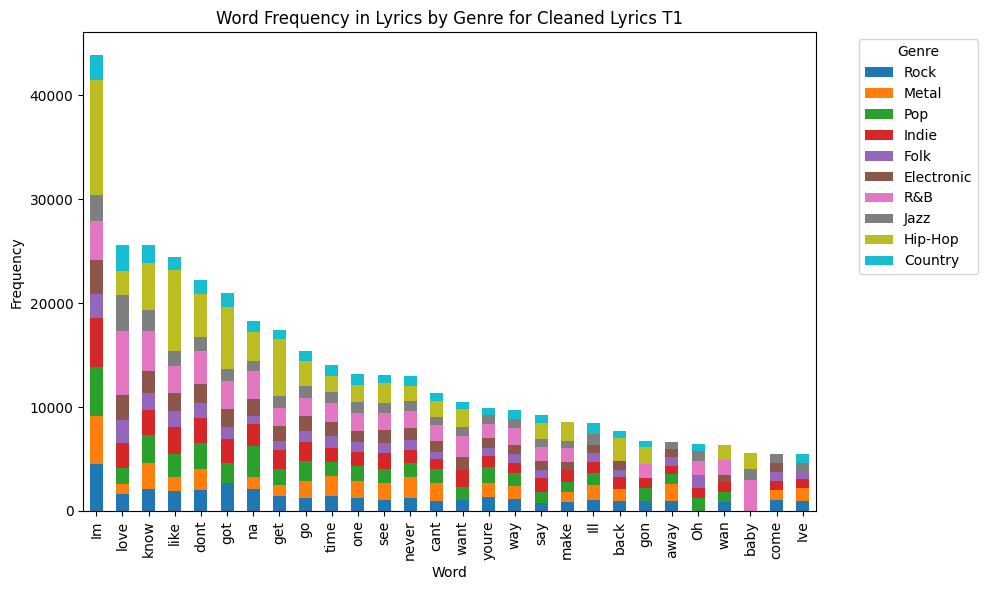

In [19]:
dictionaries = []
for genre in train_data['Genre'].unique():
    combined_dict = Counter()
    for words_dict in train_data[train_data['Genre'] == genre]['word_freq_cleaned_t1']:
        combined_dict += Counter(words_dict)

    sorted_combined_dict = dict(sorted(combined_dict.most_common(30), key=lambda item: item[1], reverse=True))
    dictionaries.append(sorted_combined_dict)


dictionary_words = set(word for dictionary in dictionaries for word in dictionary.keys())
data = {word: [dictionary.get(word, 0) for dictionary in dictionaries] for word in dictionary_words}
df = pd.DataFrame(data).T.reset_index()
df.columns = ['Word'] + list(train_data['Genre'].unique())
df.set_index('Word', inplace=True)

df['Total'] = df.sum(axis=1)
df_sorted = df.sort_values(by='Total', ascending=False)
df_plot = df_sorted[df_sorted['Total'] >= frequency_limit].drop(columns=['Total'])

ax = df_plot.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.title('Word Frequency in Lyrics by Genre for Cleaned Lyrics T1')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

As we can see, all of the words with at least 5000 frequency seem to be rather common across all of the genres for each transformation. This is not ideal, as it means that after applying the *Cleaned Lyrics T1* transformation, we still have words that are very common between each of the genres. To remedy this, we will produce our 5th data transformation - *Cleaned Lyrics T2*. This is simply the *Cleaned Lyrics T1* transformation with the 5000 most common words removed from all genres.

In [20]:
# Producing the most_common_words dataframe for our Cleaned Lyrics T1
common_words = Counter()
for d in dictionaries:
    common_words += Counter(d)
most_common_words_df = pd.DataFrame(dict(sorted(common_words.most_common(30), key=lambda item: item[1], reverse=True)), index=[0]).T.reset_index().rename(columns={'index': 'word', 0: 'freq'})
common_words_to_remove = list(most_common_words_df[most_common_words_df['freq'] >= frequency_limit]['word'])

In [21]:
# Producing our Cleaned Lyrics T2 transformation and its associated metrics
train_data['Cleaned_Lyrics_T2'] = train_data['Cleaned_Lyrics_T1'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word not in common_words_to_remove]))
train_data['words_cleaned_t2'] = train_data['Cleaned_Lyrics_T2'].apply(lambda x: x.split())
train_data['word_freq_cleaned_t2'] = train_data['words_cleaned_t2'].apply(lambda x: dict(Counter(x).most_common(50)))
train_data['Song_Length_Cleaned_T2'] = train_data['Cleaned_Lyrics_T2'].str.split(' ').str.len()

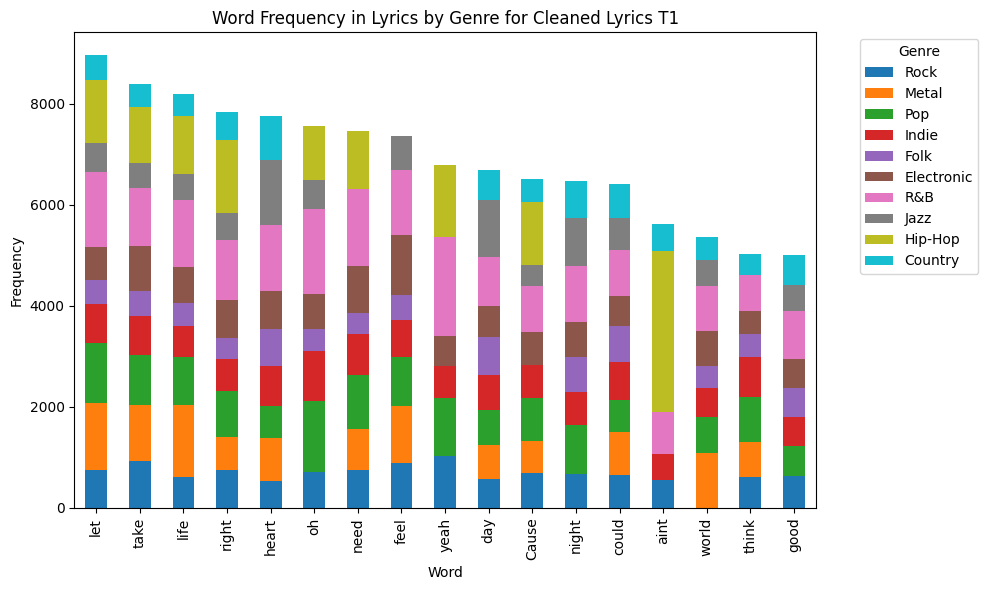

In [22]:
# Producing the same plot as above for our new data transformation
dictionaries = []
for genre in train_data['Genre'].unique():
    combined_dict = Counter()
    for words_dict in train_data[train_data['Genre'] == genre]['word_freq_cleaned_t2']:
        combined_dict += Counter(words_dict)

    sorted_combined_dict = dict(sorted(combined_dict.most_common(30), key=lambda item: item[1], reverse=True))
    dictionaries.append(sorted_combined_dict)


dictionary_words = set(word for dictionary in dictionaries for word in dictionary.keys())
data = {word: [dictionary.get(word, 0) for dictionary in dictionaries] for word in dictionary_words}
df = pd.DataFrame(data).T.reset_index()
df.columns = ['Word'] + list(train_data['Genre'].unique())
df.set_index('Word', inplace=True)

df['Total'] = df.sum(axis=1)
df_sorted = df.sort_values(by='Total', ascending=False)
df_plot = df_sorted[df_sorted['Total'] >= frequency_limit].drop(columns=['Total'])

ax = df_plot.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.title('Word Frequency in Lyrics by Genre for Cleaned Lyrics T1')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

We can see from the above graphs that now our most common words seem to be mostly meaningful words, with each genre having a word that stands out as characteristic for that genre when compared to every other word. Hip-Hop seems to still have a slightly larger frequency than the other genres for each of these words. We will investigate this further by looking at the means of each genre for each of the data transformations.

In [23]:
means = train_data[['Genre', 'Song_Length', 'Song_Length_Cleaned', 'Song_Length_Cleaned_Limited', 'Song_Length_Cleaned_T1', 'Song_Length_Cleaned_T2']].groupby(['Genre']).mean().reset_index().rename(columns={"Genre": "Data Transformation Song Length"}).T
means.columns = means.iloc[0]
means = means[1:]
means

Data Transformation Song Length,Country,Electronic,Folk,Hip-Hop,Indie,Jazz,Metal,Pop,R&B,Rock
Song_Length,199.164835,231.231039,187.2135,509.8815,210.47,165.845,212.5695,194.165,246.5145,195.8535
Song_Length_Cleaned,199.171197,240.03909,222.097,509.937,252.1255,200.0285,253.666,233.231,287.0005,234.4095
Song_Length_Cleaned_Limited,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
Song_Length_Cleaned_T1,104.26605,127.019253,113.8625,287.944,129.388,101.8055,129.473,125.095,143.793,124.444
Song_Length_Cleaned_T2,87.300174,105.366394,98.5165,246.2025,106.029,85.6655,108.5145,101.9515,113.3965,103.4285


As expected, Hip-Hop has on average a larger song length than every other genre for each of our transformations. This might affect the performance of our algorithm as it provides a greater context for the data.

We will now slice the above graphs slightly differently, producing word clouds for each genre for each data transformation, to see the most common words and how they might interact with the most common words in other genres.

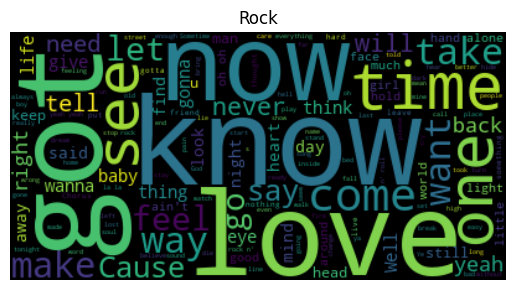

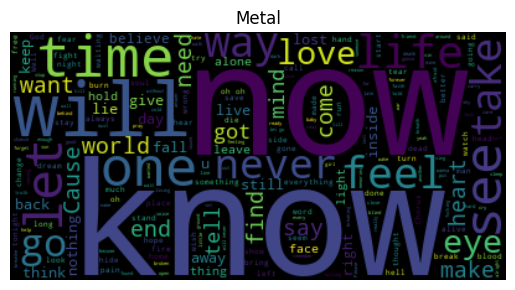

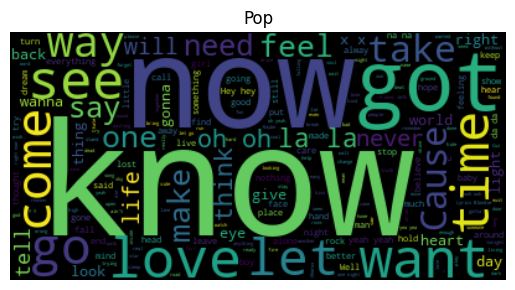

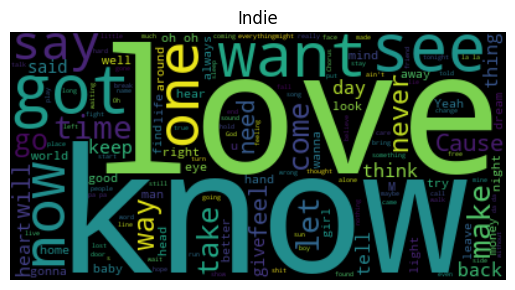

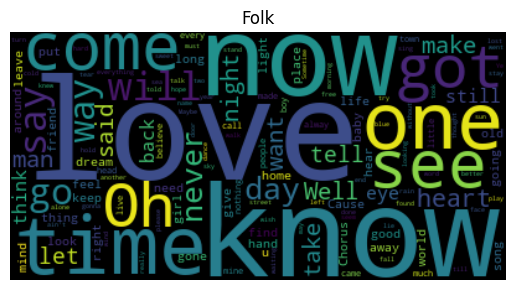

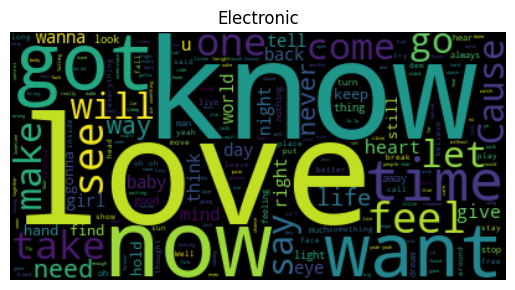

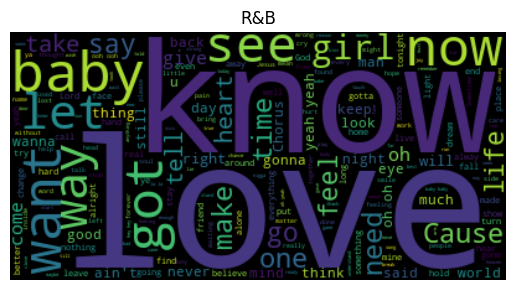

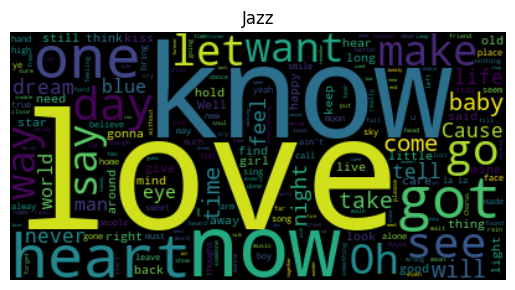

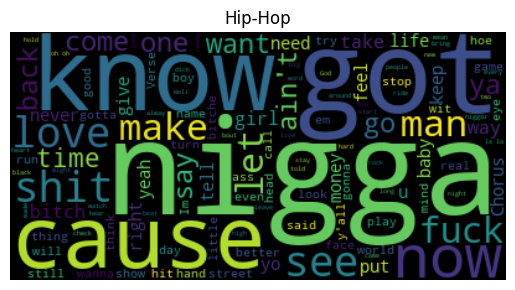

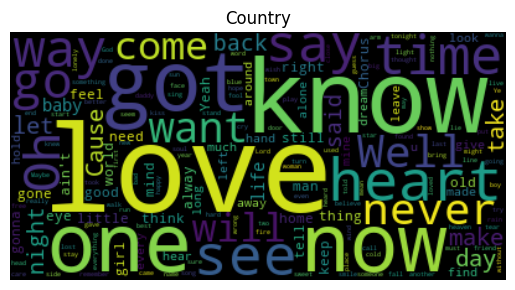

In [24]:
for genre in train_data['Genre'].unique():
     
    # Example string
    text = ' '.join(train_data[train_data['Genre'].isin([genre])]['Lyrics'])
    # Generate word cloud
    wordcloud = WordCloud().generate(text)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(genre)
    plt.axis("off")
    plt.show()

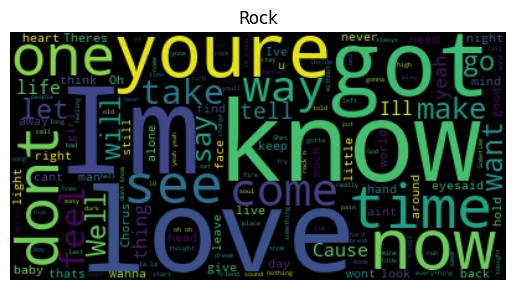

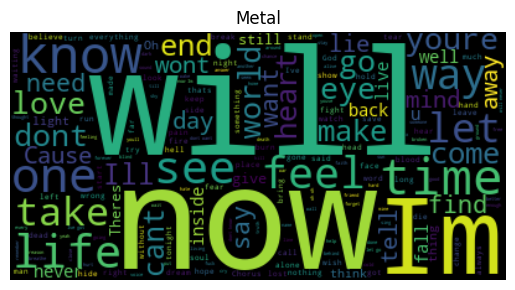

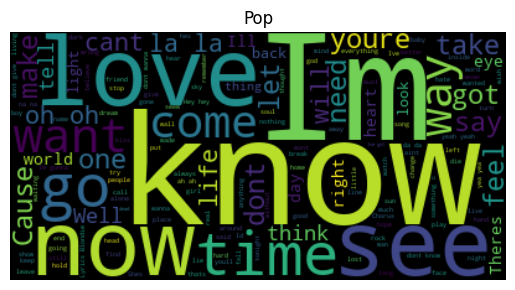

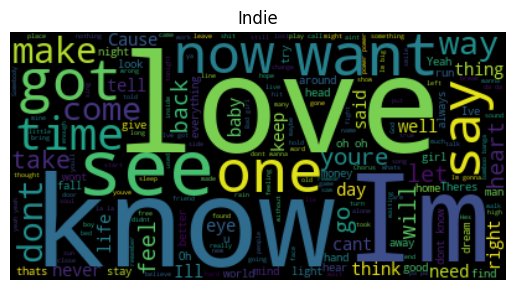

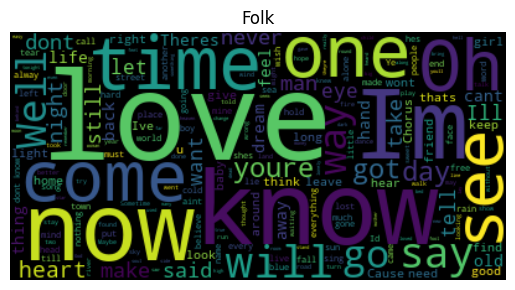

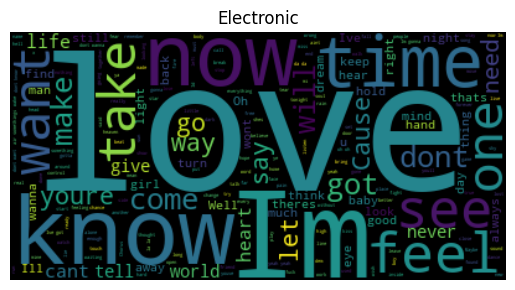

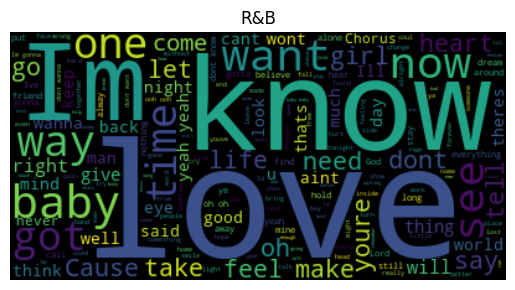

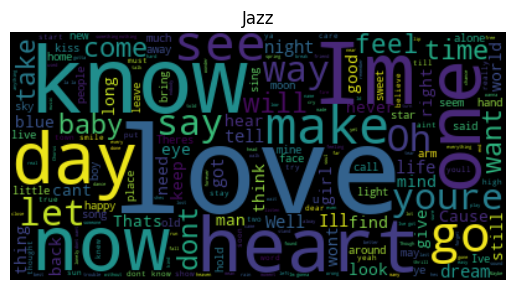

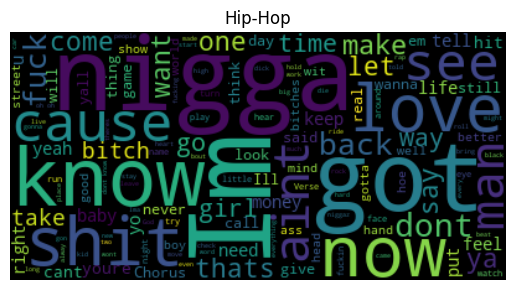

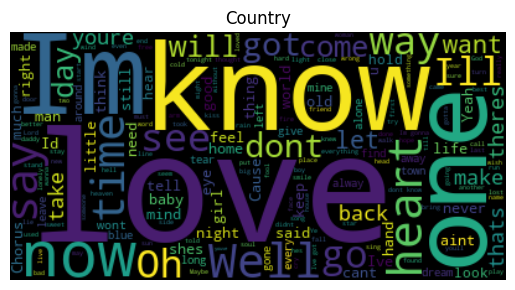

In [25]:
for genre in train_data['Genre'].unique():
     
    # Example string
    text = ' '.join(train_data[train_data['Genre'].isin([genre])]['Cleaned_Lyrics'])
    # Generate word cloud
    wordcloud = WordCloud().generate(text)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(genre)
    plt.axis("off")
    plt.show()

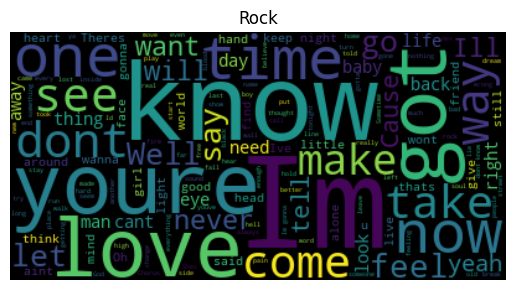

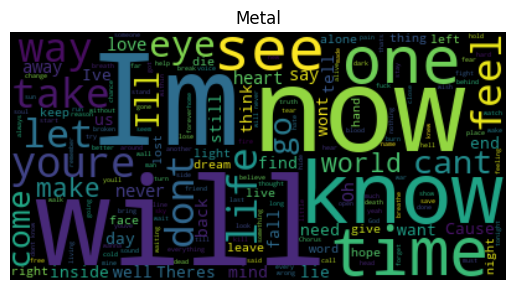

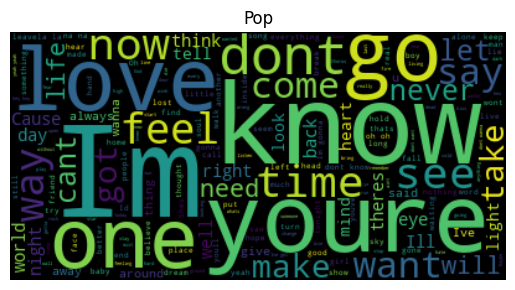

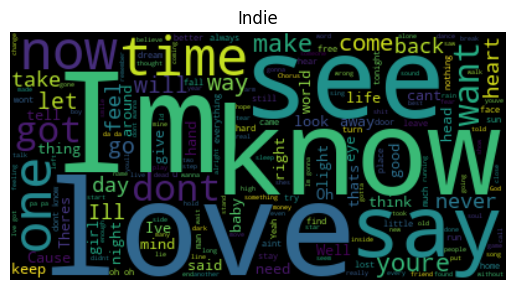

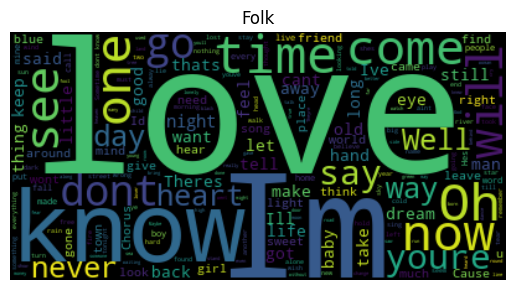

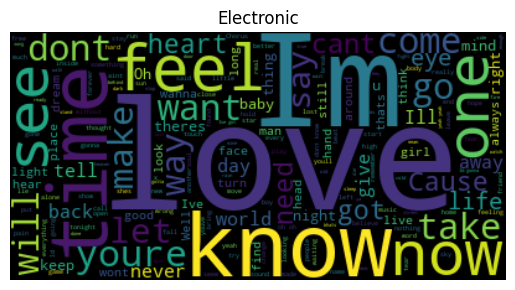

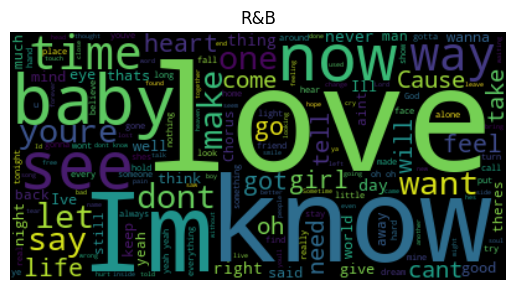

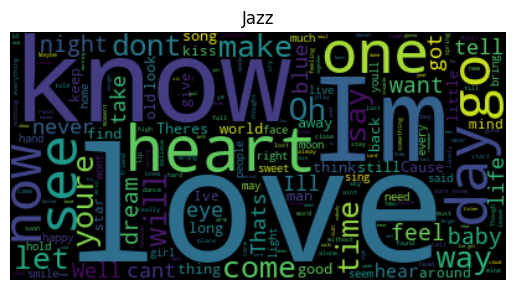

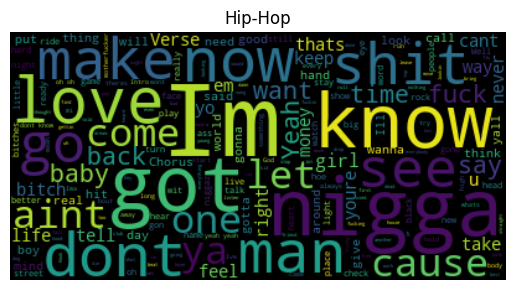

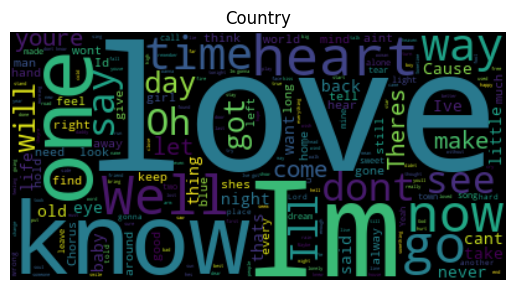

In [26]:
for genre in train_data['Genre'].unique():
     
    # Example string
    text = ' '.join(train_data[train_data['Genre'].isin([genre])]['Cleaned_Limited_Lyrics'])
    # Generate word cloud
    wordcloud = WordCloud().generate(text)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(genre)
    plt.axis("off")
    plt.show()

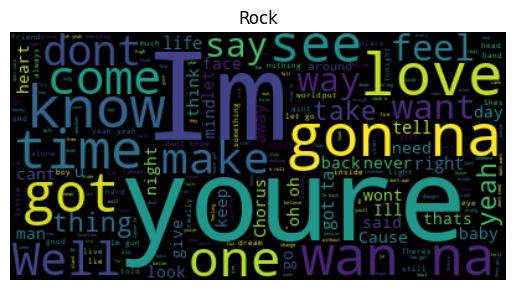

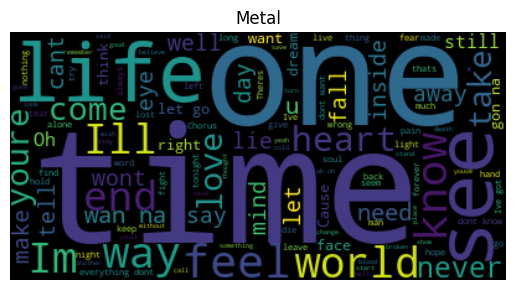

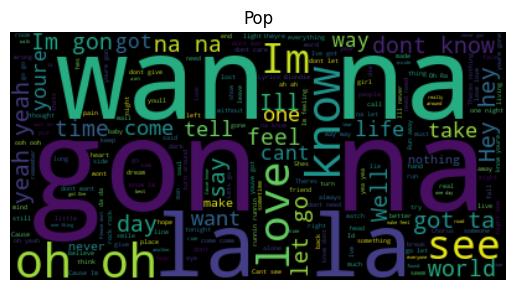

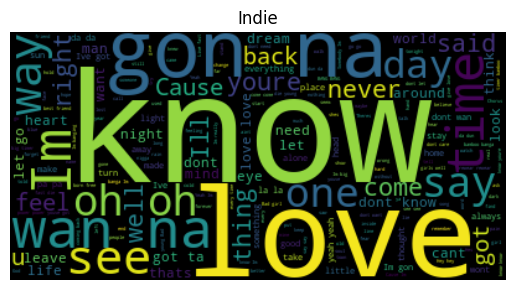

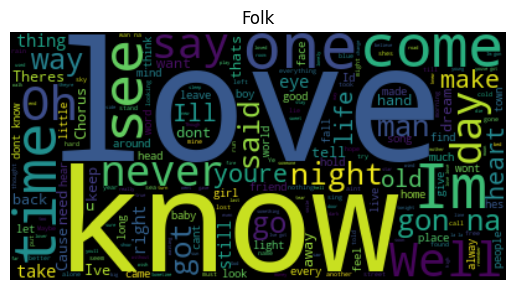

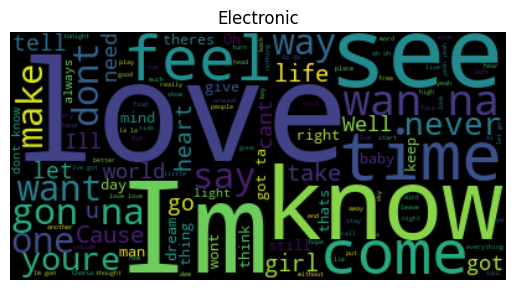

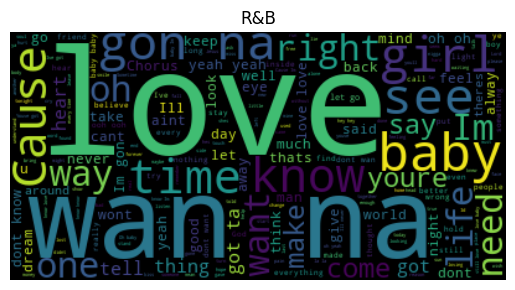

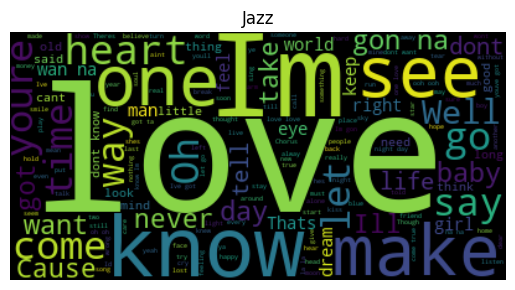

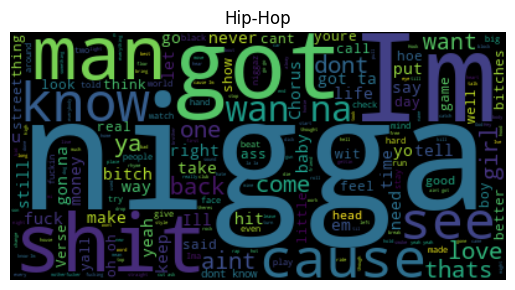

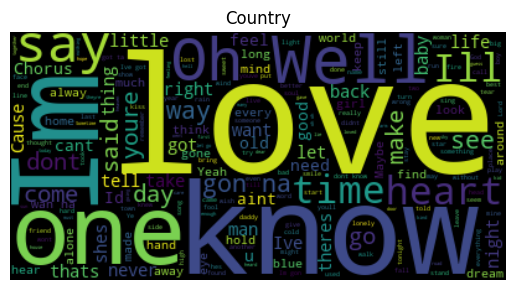

In [27]:
for genre in train_data['Genre'].unique():
     
    # Example string
    text = ' '.join(train_data[train_data['Genre'].isin([genre])]['Cleaned_Lyrics_T1'])
    # Generate word cloud
    wordcloud = WordCloud().generate(text)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(genre)
    plt.axis("off")
    plt.show()

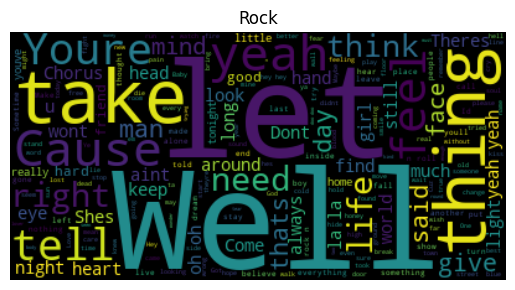

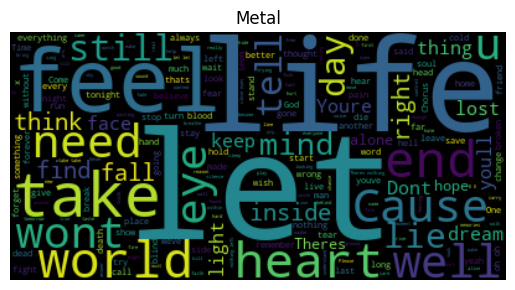

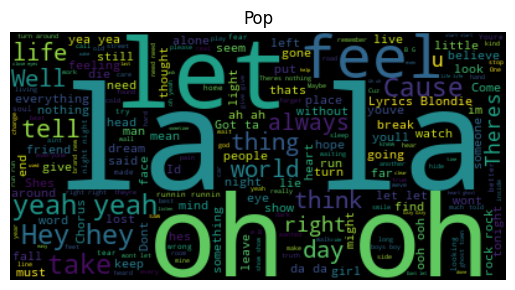

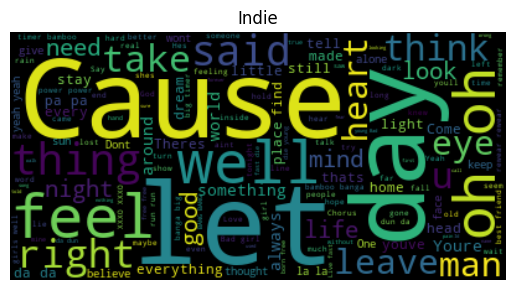

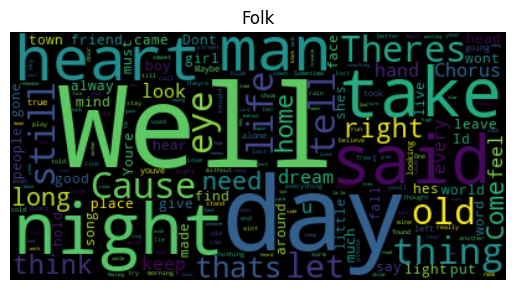

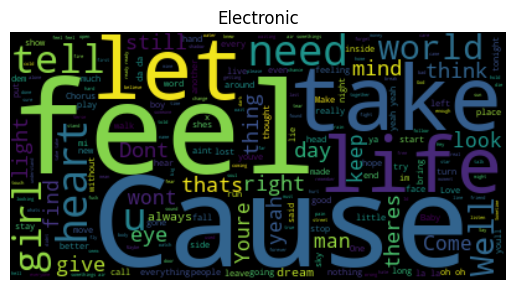

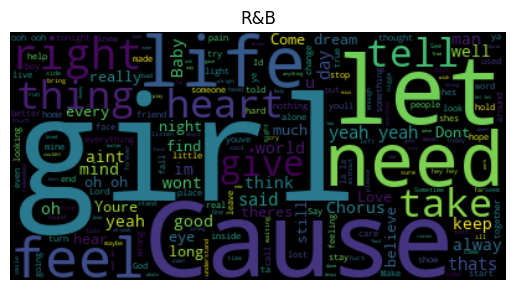

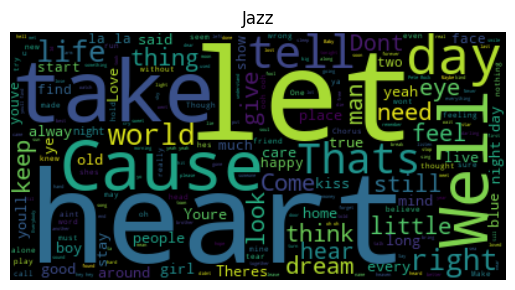

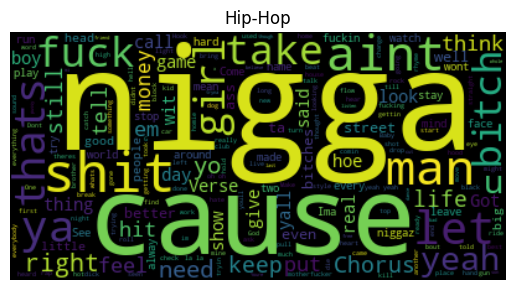

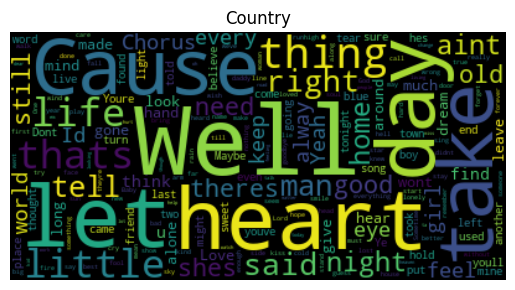

In [28]:
for genre in train_data['Genre'].unique():
     
    # Example string
    text = ' '.join(train_data[train_data['Genre'].isin([genre])]['Cleaned_Lyrics_T2'])
    # Generate word cloud
    wordcloud = WordCloud().generate(text)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(genre)
    plt.axis("off")
    plt.show()

# **Producing the Models**

To classify these songs into their respective classes, we have decided to use both an LSTM and a Bi-Directional LSTM. In order to prepare the data to feed into these models, we have produced a custom pytorch dataset for our lyrics data. To produce this, we have adapted code [from here](https://benslack19.github.io/data%20science/statistics/pytorch-dataset-objects/). We have also had to pad each of the sequences so that the LSTM models take in equal length sequences. For this, we have produced a collate_fn function to ensure that the sequences in each of our batches are of equal length. We have adapted code [from here](https://discuss.pytorch.org/t/how-to-create-batches-of-a-list-of-varying-dimension-tensors/50773/14). To produce the LSTM and the BiDirectional LSTM as well as define the training and evaluation, we have adapted code [from here](https://towardsdatascience.com/lstm-text-classification-using-pytorch-2c6c657f8fc0) [and here](https://www.kaggle.com/code/mehmetlaudatekman/lstm-text-classification-pytorch).

We have decided for this task to use a sigmoid activation function. Since we are performing multi-class classification, we have decided to use cross-entropy loss for our loss function. We have decided to use an 80/20 training/test split. We have also decided to use an Adam optimizer for our training. We have set common hyperparameters between the models to ensure that the only variables we are changing are the model and the data input. With these defined, we run our experiment.

In [ ]:
class LyricsDataset(Dataset):
    def __init__(self, lyrics, genres):
        self.lyrics = lyrics
        self.genres = genres
        self.vocab = set([word for lyrics in self.lyrics for word in lyrics.split()])
        self.word_idx = {word: idx for idx, word in enumerate(self.vocab)}
        self.genre_idx = {genre: idx for idx, genre in enumerate(set(self.genres))}
    
    def __len__(self):
        return len(self.lyrics)
    
    def __getitem__(self, idx):
        lyrics = self.lyrics[idx]
        genre = self.genres[idx]
        lyrics_indices = [self.word_idx[word] for word in lyrics.split()]
        genre_index = self.genre_idx[genre]
        return torch.tensor(lyrics_indices), torch.tensor(genre_index)

In [ ]:
def collate_fn(data):
    lyrics, genres = zip(*data)
    lyrics_indices = [torch.tensor(seq) for seq in lyrics]
    genres = torch.tensor(genres)
    lyrics_padded = pad_sequence(lyrics_indices, batch_first=True)
    lengths = torch.tensor([len(seq) for seq in lyrics_indices])
    return lyrics_padded, genres, lengths

In [125]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
class LSTM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super().__init__()
        self.Embedding = nn.Embedding(vocab_size, embedding_dim)
        self.LSTM = nn.LSTM(embedding_dim, hidden_dim, batch_first=True, dropout=0.5)
        self.Linear = nn.Linear(hidden_dim, output_dim)
        self.Sigmoid = nn.Sigmoid()
        
    def forward(self, x, lengths):
        embedded = self.Embedding(x)
        packed_embedded = pack_padded_sequence(embedded, lengths, batch_first=True, enforce_sorted=False)
        pack_padded_output, _ = self.LSTM(packed_embedded)
        pad_packed_output, _ = pad_packed_sequence(pack_padded_output, batch_first=True)
        last_hidden_state = pad_packed_output[:, -1, :]
        final_state = self.Linear(last_hidden_state)
        output = self.Sigmoid(final_state)
        return output

In [ ]:
class BiLSTM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super().__init__()
        self.Embedding = nn.Embedding(vocab_size, embedding_dim)
        self.LSTM = nn.LSTM(embedding_dim, hidden_dim, batch_first=True, dropout=0.5, bidirectional=True)
        hidden_dim = hidden_dim*2
        self.Linear = nn.Linear(hidden_dim, output_dim)
        self.Sigmoid = nn.Sigmoid()
        
    def forward(self, x, lengths):
        embedded = self.Embedding(x)
        packed_embedded = pack_padded_sequence(embedded, lengths, batch_first=True, enforce_sorted=False)
        pack_padded_output, _ = self.LSTM(packed_embedded)
        pad_packed_output, _ = pad_packed_sequence(pack_padded_output, batch_first=True)
        last_hidden_state = pad_packed_output[:, -1, :]
        final_state = self.Linear(last_hidden_state)
        output = self.Sigmoid(final_state)
        return output

In [126]:
lstm_model_accuracies_10_class = []
lstm_confusion_matricies_10_class = []

lstm_model_accuracies_2_class = []
lstm_confusion_matricies_2_class = []

In [127]:
lyrics_types = ['Lyrics', 'Cleaned_Lyrics', 'Cleaned_Lyrics_T1', 'Cleaned_Lyrics_T2', 'Cleaned_Limited_Lyrics']

In [128]:
songs_per_genre = 2000

**10 Class Classification**

LSTM

In [131]:
for lyrics_type in lyrics_types:
    print('----------',lyrics_type,'----------')
    lyrics = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()[lyrics_type])
    genres = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()['Genre'])
    # Create the dataset
    dataset = LyricsDataset(lyrics, genres)

    # Split the dataset into train and test sets
    train_size = int(0.8 * len(dataset))
    test_size = len(dataset) - train_size
    train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

    # Define hyperparameters
    vocab_size = len(dataset.vocab) + 1
    embedding_dim = 200
    hidden_dim = 512
    output_dim = len(dataset.genre2idx)
    num_epochs = 50
    batch_size = 32
    learning_rate = 0.0001

    # Create the dataloaders with custom collate function
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

    # Initialize the model
    model = LSTM(vocab_size, embedding_dim, hidden_dim, output_dim)
    model = model.to(device)

    # Define the loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    accuracies = []
    for epoch in range(num_epochs):
        model.train()
        for lyrics_indices, genres, lengths in train_dataloader:
            lyrics_indices = lyrics_indices.to(device)
            genres = genres.to(device)
            lengths = lengths.cpu()
            
            optimizer.zero_grad()
            logits = model(lyrics_indices, lengths)
            
            loss = criterion(logits, genres)
            loss.backward()
            optimizer.step()
        
        # Evaluation
        model.eval()
        with torch.no_grad():
            total_correct = 0
            total_samples = 0
            true_labels = []
            predicted_labels = []
            for lyrics_indices, genres, lengths in test_dataloader:
                lyrics_indices = lyrics_indices.to(device)
                genres = genres.to(device)
                lengths = lengths.cpu()
                
                logits = model(lyrics_indices, lengths)
                _, predictions = torch.max(logits, 1)
                
                total_correct += (predictions == genres).sum().item()
                total_samples += genres.size(0)
                true_labels.extend(genres.cpu().numpy())
                predicted_labels.extend(predictions.cpu().numpy())
            
            accuracy = total_correct / total_samples
            accuracies.append(accuracy)
            print(f'Epoch {epoch + 1}: Accuracy = {accuracy:.4f}')

    lstm_model_accuracies_10_class.append(accuracies)
    confusion = confusion_matrix(true_labels, predicted_labels)
    lstm_confusion_matricies_10_class.append(confusion)

---------- Lyrics ----------
Epoch 1: Accuracy = 0.1317
Epoch 2: Accuracy = 0.1317
Epoch 3: Accuracy = 0.1317
Epoch 4: Accuracy = 0.1317
Epoch 5: Accuracy = 0.1317
Epoch 6: Accuracy = 0.1321
Epoch 7: Accuracy = 0.1324
Epoch 8: Accuracy = 0.1314
Epoch 9: Accuracy = 0.1311
Epoch 10: Accuracy = 0.1321
Epoch 11: Accuracy = 0.1311
Epoch 12: Accuracy = 0.1311
Epoch 13: Accuracy = 0.1305
Epoch 14: Accuracy = 0.1286
Epoch 15: Accuracy = 0.1308
Epoch 16: Accuracy = 0.1283
Epoch 17: Accuracy = 0.1305
Epoch 18: Accuracy = 0.1305
Epoch 19: Accuracy = 0.1290
Epoch 20: Accuracy = 0.1274
Epoch 21: Accuracy = 0.1243
Epoch 22: Accuracy = 0.1283
Epoch 23: Accuracy = 0.1299
Epoch 24: Accuracy = 0.1268
Epoch 25: Accuracy = 0.1280
Epoch 26: Accuracy = 0.1259
Epoch 27: Accuracy = 0.1290
Epoch 28: Accuracy = 0.1268
Epoch 29: Accuracy = 0.1299
Epoch 30: Accuracy = 0.1252
Epoch 31: Accuracy = 0.1271
Epoch 32: Accuracy = 0.1277
Epoch 33: Accuracy = 0.1240
Epoch 34: Accuracy = 0.1277
Epoch 35: Accuracy = 0.1265


Bi-Directional LSTM

In [134]:
for lyrics_type in lyrics_types:
    print('----------',lyrics_type,'----------')
    lyrics = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()[lyrics_type])
    genres = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()['Genre'])
    # Create the dataset
    dataset = LyricsDataset(lyrics, genres)

    # Split the dataset into train and test sets
    train_size = int(0.8 * len(dataset))
    test_size = len(dataset) - train_size
    train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

    # Define hyperparameters
    vocab_size = len(dataset.vocab) + 1
    embedding_dim = 200
    hidden_dim = 512
    output_dim = len(dataset.genre2idx)
    num_epochs = 50
    batch_size = 32
    learning_rate = 0.0001

    # Create the dataloaders with custom collate function
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

    # Initialize the model
    model = BiLSTM(vocab_size, embedding_dim, hidden_dim, output_dim)
    model = model.to(device)

    # Define the loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    accuracies = []
    for epoch in range(num_epochs):
        model.train()
        for lyrics_indices, genres, lengths in train_dataloader:
            lyrics_indices = lyrics_indices.to(device)
            genres = genres.to(device)
            lengths = lengths.cpu()
            
            optimizer.zero_grad()
            logits = model(lyrics_indices, lengths)
            
            loss = criterion(logits, genres)
            loss.backward()
            optimizer.step()
        
        # Evaluation
        model.eval()
        with torch.no_grad():
            total_correct = 0
            total_samples = 0
            true_labels = []
            predicted_labels = []
            for lyrics_indices, genres, lengths in test_dataloader:
                lyrics_indices = lyrics_indices.to(device)
                genres = genres.to(device)
                lengths = lengths.cpu()
                
                logits = model(lyrics_indices, lengths)
                _, predictions = torch.max(logits, 1)
                
                total_correct += (predictions == genres).sum().item()
                total_samples += genres.size(0)
                true_labels.extend(genres.cpu().numpy())
                predicted_labels.extend(predictions.cpu().numpy())
            
            accuracy = total_correct / total_samples
            accuracies.append(accuracy)
            print(f'Epoch {epoch + 1}: Accuracy = {accuracy:.4f}')

    lstm_model_accuracies_10_class.append(accuracies)
    confusion = confusion_matrix(true_labels, predicted_labels)
    lstm_confusion_matricies_10_class.append(confusion)

---------- Lyrics ----------
Epoch 1: Accuracy = 0.1454
Epoch 2: Accuracy = 0.1454
Epoch 3: Accuracy = 0.1454
Epoch 4: Accuracy = 0.1457
Epoch 5: Accuracy = 0.1454
Epoch 6: Accuracy = 0.1463
Epoch 7: Accuracy = 0.1336
Epoch 8: Accuracy = 0.1330
Epoch 9: Accuracy = 0.1333
Epoch 10: Accuracy = 0.1327
Epoch 11: Accuracy = 0.1324
Epoch 12: Accuracy = 0.1327
Epoch 13: Accuracy = 0.1327
Epoch 14: Accuracy = 0.1321
Epoch 15: Accuracy = 0.1321
Epoch 16: Accuracy = 0.1317
Epoch 17: Accuracy = 0.1327
Epoch 18: Accuracy = 0.1308
Epoch 19: Accuracy = 0.1321
Epoch 20: Accuracy = 0.1321
Epoch 21: Accuracy = 0.1302
Epoch 22: Accuracy = 0.1324
Epoch 23: Accuracy = 0.1327
Epoch 24: Accuracy = 0.1327
Epoch 25: Accuracy = 0.1321
Epoch 26: Accuracy = 0.1321
Epoch 27: Accuracy = 0.1305
Epoch 28: Accuracy = 0.1321
Epoch 29: Accuracy = 0.1327
Epoch 30: Accuracy = 0.1327
Epoch 31: Accuracy = 0.1314
Epoch 32: Accuracy = 0.1321
Epoch 33: Accuracy = 0.1308
Epoch 34: Accuracy = 0.1324
Epoch 35: Accuracy = 0.1314


**2 Class Classification**

In [135]:
train_data = train_data[train_data['Genre'].isin(['Rock', 'Pop'])]

LSTM

In [138]:
for lyrics_type in lyrics_types:
    print('----------',lyrics_type,'----------')
    lyrics = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()[lyrics_type])
    genres = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()['Genre'])
    # Create the dataset
    dataset = LyricsDataset(lyrics, genres)

    # Split the dataset into train and test sets
    train_size = int(0.8 * len(dataset))
    test_size = len(dataset) - train_size
    train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

    # Define hyperparameters
    vocab_size = len(dataset.vocab) + 1
    embedding_dim = 200
    hidden_dim = 512
    output_dim = len(dataset.genre2idx)
    num_epochs = 50
    batch_size = 32
    learning_rate = 0.0001

    # Create the dataloaders with custom collate function
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

    # Initialize the model
    model = LSTM(vocab_size, embedding_dim, hidden_dim, output_dim)
    model = model.to(device)

    # Define the loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    accuracies = []
    for epoch in range(num_epochs):
        model.train()
        for lyrics_indices, genres, lengths in train_dataloader:
            lyrics_indices = lyrics_indices.to(device)
            genres = genres.to(device)
            lengths = lengths.cpu()
            
            optimizer.zero_grad()
            logits = model(lyrics_indices, lengths)
            
            loss = criterion(logits, genres)
            loss.backward()
            optimizer.step()
        
        # Evaluation
        model.eval()
        with torch.no_grad():
            total_correct = 0
            total_samples = 0
            true_labels = []
            predicted_labels = []
            for lyrics_indices, genres, lengths in test_dataloader:
                lyrics_indices = lyrics_indices.to(device)
                genres = genres.to(device)
                lengths = lengths.cpu()
                
                logits = model(lyrics_indices, lengths)
                _, predictions = torch.max(logits, 1)
                
                total_correct += (predictions == genres).sum().item()
                total_samples += genres.size(0)
                true_labels.extend(genres.cpu().numpy())
                predicted_labels.extend(predictions.cpu().numpy())
            
            accuracy = total_correct / total_samples
            accuracies.append(accuracy)
            print(f'Epoch {epoch + 1}: Accuracy = {accuracy:.4f}')

    lstm_model_accuracies_2_class.append(accuracies)
    confusion = confusion_matrix(true_labels, predicted_labels)
    lstm_confusion_matricies_2_class.append(confusion)

---------- Lyrics ----------
Epoch 1: Accuracy = 0.4900
Epoch 2: Accuracy = 0.4913
Epoch 3: Accuracy = 0.4938
Epoch 4: Accuracy = 0.4925
Epoch 5: Accuracy = 0.4950
Epoch 6: Accuracy = 0.4975
Epoch 7: Accuracy = 0.4963
Epoch 8: Accuracy = 0.4963
Epoch 9: Accuracy = 0.4950
Epoch 10: Accuracy = 0.4950
Epoch 11: Accuracy = 0.4975
Epoch 12: Accuracy = 0.4988
Epoch 13: Accuracy = 0.4975
Epoch 14: Accuracy = 0.4975
Epoch 15: Accuracy = 0.4988
Epoch 16: Accuracy = 0.4975
Epoch 17: Accuracy = 0.4975
Epoch 18: Accuracy = 0.4975
Epoch 19: Accuracy = 0.4975
Epoch 20: Accuracy = 0.4988
Epoch 21: Accuracy = 0.4975
Epoch 22: Accuracy = 0.4975
Epoch 23: Accuracy = 0.4975
Epoch 24: Accuracy = 0.4975
Epoch 25: Accuracy = 0.4975
Epoch 26: Accuracy = 0.4975
Epoch 27: Accuracy = 0.4963
Epoch 28: Accuracy = 0.4988
Epoch 29: Accuracy = 0.5000
Epoch 30: Accuracy = 0.4988
Epoch 31: Accuracy = 0.4988
Epoch 32: Accuracy = 0.5000
Epoch 33: Accuracy = 0.4975
Epoch 34: Accuracy = 0.4988
Epoch 35: Accuracy = 0.4988


Bi-Directional LSTM

In [141]:
for lyrics_type in lyrics_types:
    print('----------',lyrics_type,'----------')
    lyrics = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()[lyrics_type])
    genres = list(train_data.groupby(['Genre']).head(songs_per_genre).reset_index()['Genre'])
    # Create the dataset
    dataset = LyricsDataset(lyrics, genres)

    # Split the dataset into train and test sets
    train_size = int(0.8 * len(dataset))
    test_size = len(dataset) - train_size
    train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

    # Define hyperparameters
    vocab_size = len(dataset.vocab) + 1
    embedding_dim = 200
    hidden_dim = 512
    output_dim = len(dataset.genre2idx)
    num_epochs = 50
    batch_size = 32
    learning_rate = 0.0001

    # Create the dataloaders with custom collate function
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

    # Initialize the model
    model = BiLSTM(vocab_size, embedding_dim, hidden_dim, output_dim)
    model = model.to(device)

    # Define the loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    accuracies = []
    for epoch in range(num_epochs):
        model.train()
        for lyrics_indices, genres, lengths in train_dataloader:
            lyrics_indices = lyrics_indices.to(device)
            genres = genres.to(device)
            lengths = lengths.cpu()
            
            optimizer.zero_grad()
            logits = model(lyrics_indices, lengths)
            
            loss = criterion(logits, genres)
            loss.backward()
            optimizer.step()
        
        # Evaluation
        model.eval()
        with torch.no_grad():
            total_correct = 0
            total_samples = 0
            true_labels = []
            predicted_labels = []
            for lyrics_indices, genres, lengths in test_dataloader:
                lyrics_indices = lyrics_indices.to(device)
                genres = genres.to(device)
                lengths = lengths.cpu()
                
                logits = model(lyrics_indices, lengths)
                _, predictions = torch.max(logits, 1)
                
                total_correct += (predictions == genres).sum().item()
                total_samples += genres.size(0)
                true_labels.extend(genres.cpu().numpy())
                predicted_labels.extend(predictions.cpu().numpy())
            
            accuracy = total_correct / total_samples
            accuracies.append(accuracy)
            print(f'Epoch {epoch + 1}: Accuracy = {accuracy:.4f}')

    lstm_model_accuracies_2_class.append(accuracies)
    confusion = confusion_matrix(true_labels, predicted_labels)
    lstm_confusion_matricies_2_class.append(confusion)

---------- Lyrics ----------
Epoch 1: Accuracy = 0.5337
Epoch 2: Accuracy = 0.5437
Epoch 3: Accuracy = 0.5413
Epoch 4: Accuracy = 0.5437
Epoch 5: Accuracy = 0.4738
Epoch 6: Accuracy = 0.4750
Epoch 7: Accuracy = 0.4750
Epoch 8: Accuracy = 0.4788
Epoch 9: Accuracy = 0.4763
Epoch 10: Accuracy = 0.4763
Epoch 11: Accuracy = 0.4775
Epoch 12: Accuracy = 0.4750
Epoch 13: Accuracy = 0.4775
Epoch 14: Accuracy = 0.4763
Epoch 15: Accuracy = 0.4763
Epoch 16: Accuracy = 0.4750
Epoch 17: Accuracy = 0.4750
Epoch 18: Accuracy = 0.4775
Epoch 19: Accuracy = 0.4788
Epoch 20: Accuracy = 0.4775
Epoch 21: Accuracy = 0.4775
Epoch 22: Accuracy = 0.4775
Epoch 23: Accuracy = 0.4775
Epoch 24: Accuracy = 0.4775
Epoch 25: Accuracy = 0.4775
Epoch 26: Accuracy = 0.4788
Epoch 27: Accuracy = 0.4788
Epoch 28: Accuracy = 0.4788
Epoch 29: Accuracy = 0.4788
Epoch 30: Accuracy = 0.4800
Epoch 31: Accuracy = 0.4800
Epoch 32: Accuracy = 0.4788
Epoch 33: Accuracy = 0.4788
Epoch 34: Accuracy = 0.4775
Epoch 35: Accuracy = 0.4775


# **Results**

Looking at the results below, we can see that these models, overall, performed rather poorly, achieving an accuracy of around 10% on most of the data transformations for both the LSTM and the Bi-Directional LSTM for the 10-class classification task. This is effectively the same as a random selection across the classes, which is obviously not the intended outcome. Similarly in the 2-class classification task, our algorithms performed roughly the same, achieving an accuracy of around 50%, which is, once again, effectively the same as a random selection. Notably, both the LSTM and the Bi-Directional LSTM performed much better on the *Cleaned Limited Lyrics* data, achieving accuracies of about 35% and 75% on the 2-class and 10-class classification tasks respectively. While we can clearly see a drop in accuracy due to overtraining for many of these tests, the maximum accuracy can be considered and the model retrained on fewer epochs to produce similar results. The accuracies prior to overfitting are not significantly higher than those in later epochs, and is this likely inconsequential to the results produced by the models.

However, looking deeper into the confusion matrices produces a much different story. Instead of a random selection on each of the classes for both tasks, the algorithms have mostly trained to predict only 1 class, which explains the effectively random accuracy that has been observed. It is noteable, however, that despite this same "strategy" of single-class prediction adopted by the both algorithms on both classification tasks, the accuracy for the *Cleaned Limited Lyrics* data transformation is much much higher. This may be due to the fixed lyric size ensuring that each sequence has the same context length. 

The one standout for the confusion matrices are the confusion matricies produced for the *Cleaned*, *Cleaned T1* and *Cleaned T2* data transformations for the Bi-Directional LSTM. While the accuracy of the model on these transformations is similar to other accuracies, the confusion matrix clearly depicts variation in the prediction classes. This is indicative of a superior model performance, in spite of lower accuracy.

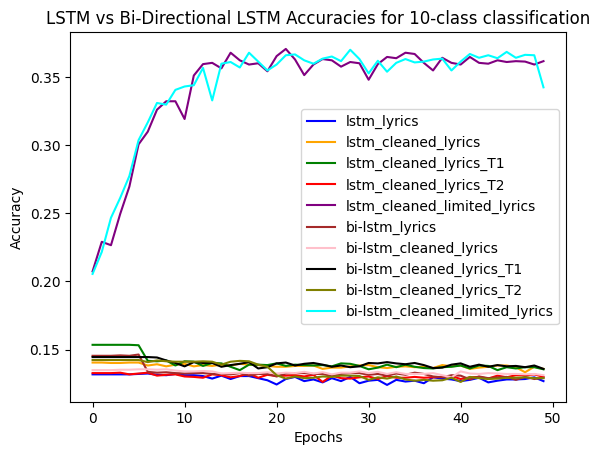

In [144]:
X = np.arange(0,50)
colours = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'black', 'olive', 'cyan']
labels = ['lstm_lyrics', 'lstm_cleaned_lyrics', 'lstm_cleaned_lyrics_T1', 'lstm_cleaned_lyrics_T2', 'lstm_cleaned_limited_lyrics', 'bi-lstm_lyrics', 'bi-lstm_cleaned_lyrics','bi-lstm_cleaned_lyrics_T1', 'bi-lstm_cleaned_lyrics_T2', 'bi-lstm_cleaned_limited_lyrics']
for i in range(len(lstm_model_accuracies_10_class)):
    plt.plot(X, lstm_model_accuracies_10_class[i], color=colours[i], label = labels[i])

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('LSTM vs Bi-Directional LSTM Accuracies for 10-class classification')
plt.legend()
plt.show()

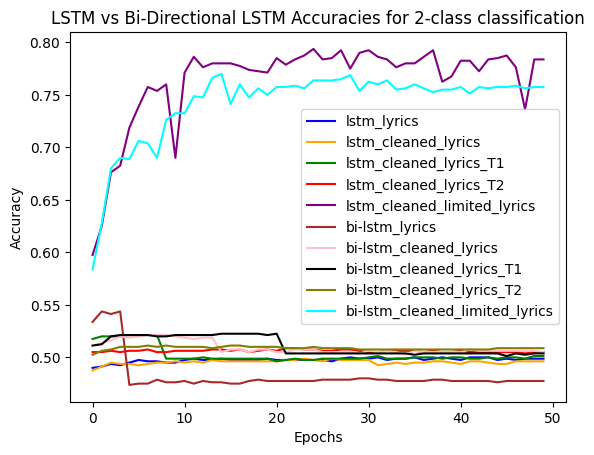

In [145]:
X = np.arange(0,50)
colours = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'black', 'olive', 'cyan']
labels = ['lstm_lyrics', 'lstm_cleaned_lyrics', 'lstm_cleaned_lyrics_T1', 'lstm_cleaned_lyrics_T2', 'lstm_cleaned_limited_lyrics', 'bi-lstm_lyrics', 'bi-lstm_cleaned_lyrics','bi-lstm_cleaned_lyrics_T1', 'bi-lstm_cleaned_lyrics_T2', 'bi-lstm_cleaned_limited_lyrics']
for i in range(len(lstm_model_accuracies_2_class)):
    plt.plot(X, lstm_model_accuracies_2_class[i], color=colours[i], label = labels[i])

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('LSTM vs Bi-Directional LSTM Accuracies for 2-class classification')
plt.legend()
plt.show()

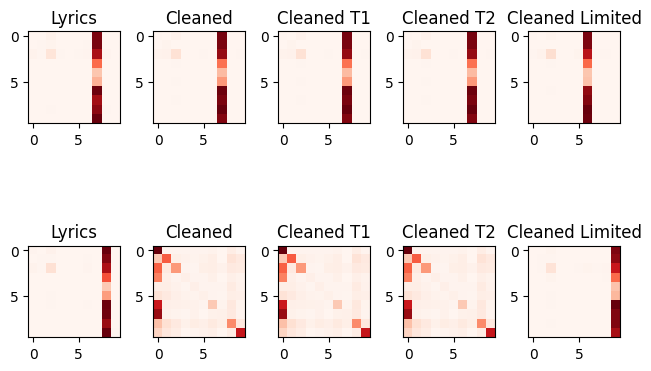

In [146]:
figure, axis = plt.subplots(2, 5)

axis[0,0].imshow(lstm_confusion_matricies_10_class[0], cmap = 'Reds')
axis[0,0].set_title('Lyrics')
axis[0,1].imshow(lstm_confusion_matricies_10_class[1], cmap = 'Reds')
axis[0,1].set_title('Cleaned')
axis[0,2].imshow(lstm_confusion_matricies_10_class[1], cmap = 'Reds')
axis[0,2].set_title('Cleaned T1')
axis[0,3].imshow(lstm_confusion_matricies_10_class[1], cmap = 'Reds')
axis[0,3].set_title('Cleaned T2')
axis[0,4].imshow(lstm_confusion_matricies_10_class[2], cmap = 'Reds')
axis[0,4].set_title('Cleaned Limited')
axis[1,0].imshow(lstm_confusion_matricies_10_class[3], cmap = 'Reds')
axis[1,0].set_title('Lyrics')
axis[1,1].imshow(lstm_confusion_matricies_10_class[4], cmap = 'Reds')
axis[1,1].set_title('Cleaned')
axis[1,2].imshow(lstm_confusion_matricies_10_class[4], cmap = 'Reds')
axis[1,2].set_title('Cleaned T1')
axis[1,3].imshow(lstm_confusion_matricies_10_class[4], cmap = 'Reds')
axis[1,3].set_title('Cleaned T2')
axis[1,4].imshow(lstm_confusion_matricies_10_class[5], cmap = 'Reds')
axis[1,4].set_title('Cleaned Limited')

figure.tight_layout()
plt.show()

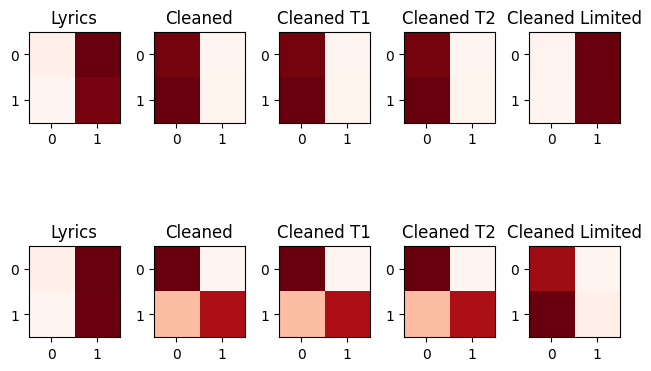

In [147]:
figure, axis = plt.subplots(2, 5)

axis[0,0].imshow(lstm_confusion_matricies_2_class[0], cmap = 'Reds')
axis[0,0].set_title('Lyrics')
axis[0,1].imshow(lstm_confusion_matricies_2_class[1], cmap = 'Reds')
axis[0,1].set_title('Cleaned')
axis[0,2].imshow(lstm_confusion_matricies_2_class[1], cmap = 'Reds')
axis[0,2].set_title('Cleaned T1')
axis[0,3].imshow(lstm_confusion_matricies_2_class[1], cmap = 'Reds')
axis[0,3].set_title('Cleaned T2')
axis[0,4].imshow(lstm_confusion_matricies_2_class[2], cmap = 'Reds')
axis[0,4].set_title('Cleaned Limited')
axis[1,0].imshow(lstm_confusion_matricies_2_class[3], cmap = 'Reds')
axis[1,0].set_title('Lyrics')
axis[1,1].imshow(lstm_confusion_matricies_2_class[4], cmap = 'Reds')
axis[1,1].set_title('Cleaned')
axis[1,2].imshow(lstm_confusion_matricies_2_class[4], cmap = 'Reds')
axis[1,2].set_title('Cleaned T1')
axis[1,3].imshow(lstm_confusion_matricies_2_class[4], cmap = 'Reds')
axis[1,3].set_title('Cleaned T2')
axis[1,4].imshow(lstm_confusion_matricies_2_class[5], cmap = 'Reds')
axis[1,4].set_title('Cleaned Limited')

figure.tight_layout()
plt.show()

# **Discussion**

While our models performed rather poorly for this investigation, we have identified points of interest that may warrant further investigation and specific weaknesses in our approach that may be improved upon to produce a much more useful Lyrics Classification model. 

One of the main limitations in our approach was training time for the models. As such, one of the decisions we made was to significantly reduce the size of the dataset that we were feeding into the model. It is quite possible that this reduced dataset size resulted in insufficient data for the model to learn on. Future approaches could utilise a greater subset of the dataset, specifically on the 2-class classification task.

Another meaningful limitation to our approach was the decision to keep constant the hyperparameters in our experiment. As the objective was to test each of the data transformations, we wanted to ensure that these were kept constant at values that seemed generally good across individual runs. An improvement to an optimal model would require more specific hyperparameter tuning.

One of the main strengths of our approach however was that we utilised multiple different data transformations. From our model, we could see that the highest accuracy was achieved by the *Cleaned Limited Lyrics* and the lowest error rates were produced by the *Cleaned Lyrics T2*. Future approaches could improve upon this by utilising some combination of these transformations to produce an overall more useful model.